In [18]:
from sklearn import linear_model
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import time
import plotly.express as px
import pandas_profiling as pp

%matplotlib inline

ModuleNotFoundError: No module named 'pandas_profiling'

In [2]:
# 폰트설정 (맥)
from matplotlib import font_manager
plt.rcParams["font.family"] = 'NanumGothicCoding'
from matplotlib import rc
rc('font', family="Arial Unicode MS")
plt.rcParams['font.family'] = 'AppleGothic'

In [3]:
# 폰트 설정 (윈도우)
from matplotlib import rc

rc('font', family='Malgun Gothic')

# Data 불러오기

## 부동산(Train) Data

 <img src="./datas/data_source.png" style="width:100%;">

 <img src="./datas/csv.png" style="width:100%;">

In [4]:
train = pd.read_csv('datas/train.csv')

In [5]:
train['P/m^2'] = train['transaction_real_price']/train['exclusive_use_area'] # 평당가격 column 추가

In [6]:
train['year'] =  round(train['transaction_year_month'] / 100)
train['month'] = train['transaction_year_month'] % 100

In [7]:
train = train[['transaction_id', 'apartment_id', 'city',  'dong', 'jibun', 'apt',
               'addr_kr', 'exclusive_use_area', 'year_of_completion',
               'transaction_year_month','year', 'month', 'transaction_date', 'floor', 'P/m^2',
               'transaction_real_price']]

In [8]:
train.head()

,transaction_id,apartment_id,city,dong,jibun,apt,addr_kr,exclusive_use_area,year_of_completion,transaction_year_month,year,month,transaction_date,floor,P/m^2,transaction_real_price
0,0,7622,서울특별시,신교동,6-13,신현(101동),신교동 6-13 신현(101동),84.82,2002,200801,2008.0,1,21~31,2,442.112709,37500
1,1,5399,서울특별시,필운동,142,사직파크맨션,필운동 142 사직파크맨션,99.17,1973,200801,2008.0,1,1~10,6,201.673893,20000
2,2,3578,서울특별시,필운동,174-1,두레엘리시안,필운동 174-1 두레엘리시안,84.74,2007,200801,2008.0,1,1~10,6,454.330895,38500
3,3,10957,서울특별시,내수동,95,파크팰리스,내수동 95 파크팰리스,146.39,2003,200801,2008.0,1,11~20,15,806.065988,118000
4,4,10639,서울특별시,내수동,110-15,킹스매너,내수동 110-15 킹스매너,194.43,2004,200801,2008.0,1,21~31,3,617.188705,120000


In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1216553 entries, 0 to 1216552
Data columns (total 16 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   transaction_id          1216553 non-null  int64  
 1   apartment_id            1216553 non-null  int64  
 2   city                    1216553 non-null  object 
 3   dong                    1216553 non-null  object 
 4   jibun                   1216553 non-null  object 
 5   apt                     1216553 non-null  object 
 6   addr_kr                 1216553 non-null  object 
 7   exclusive_use_area      1216553 non-null  float64
 8   year_of_completion      1216553 non-null  int64  
 9   transaction_year_month  1216553 non-null  int64  
 10  year                    1216553 non-null  float64
 11  month                   1216553 non-null  int64  
 12  transaction_date        1216553 non-null  object 
 13  floor                   1216553 non-null  int64  
 14  P/

## 공원 Data

In [10]:
park = pd.read_csv('datas/park.csv')
park.tail(50)

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
1309,부산광역시,사상구,모라동,모라벤처타워공원,소공원,735.8,NaN,NaN,NaN,NaN,평의자 외 2종 12점,2012.0,2019-03-21
1310,부산광역시,사상구,주례동,주감공원,소공원,1250.0,NaN,NaN,NaN,NaN,파고라 외 4종 7점,2013.0,2019-03-21
1311,부산광역시,사상구,덕포동,문화공원,문화공원,3160.0,NaN,NaN,NaN,NaN,NaN,2017.0,2019-03-21
1312,서울특별시,구로구,신도림동,미래사랑어린이공원,어린이공원,5870.0,체력단련시설 5점,조합놀이 1기,NaN,NaN,NaN,2004.0,2019-02-25
1313,서울특별시,구로구,신도림동,신도림역문화공원,문화공원,3322.0,NaN,NaN,NaN,NaN,NaN,2006.0,2019-02-25
1314,서울특별시,구로구,신도림동,신도림어린이공원,어린이공원,2292.0,체력단련시설 6점,모래밭 1기,NaN,NaN,NaN,2000.0,2019-02-25
1315,서울특별시,구로구,구로동,희망어린이공원,어린이공원,911.0,체력단련시설 3점,"그네 1기, 조합놀이 1기",NaN,NaN,NaN,1965.0,2019-02-25
1316,서울특별시,구로구,구로동,꿈마을어린이공원,어린이공원,1609.0,체력단련시설 6점,"모래밭 1기, 시소1기, 조합놀이 1기",NaN,NaN,NaN,1970.0,2019-02-25
1317,서울특별시,구로구,구로동,구로리어린이공원,어린이공원,7782.0,체력단련시설 9점,"그네 1기, 모래밭 1기, 시소 2기, 조합놀이 1기",NaN,NaN,NaN,1977.0,2019-02-25
1318,서울특별시,구로구,구로동,솔길어린이공원,어린이공원,1999.0,체력단련시설 5점,"그네 1기, 모래밭 1기, 조합놀이 2기",NaN,NaN,NaN,1981.0,2019-02-25


In [11]:
park.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1359 entries, 0 to 1358
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   city                         1359 non-null   object 
 1   gu                           1356 non-null   object 
 2   dong                         1359 non-null   object 
 3   park_name                    1359 non-null   object 
 4   park_type                    1359 non-null   object 
 5   park_area                    1359 non-null   float64
 6   park_exercise_facility       277 non-null    object 
 7   park_entertainment_facility  435 non-null    object 
 8   park_benefit_facility        266 non-null    object 
 9   park_cultural_facitiy        72 non-null     object 
 10  park_facility_other          175 non-null    object 
 11  park_open_year               937 non-null    float64
 12  reference_date               1359 non-null   object 
dtypes: float64(2), obj

## 어린이집 Data

In [12]:
day_care = pd.read_csv('datas/day_care_center.csv')
day_care.tail()

,city,gu,day_care_name,day_care_type,day_care_baby_num,teacher_num,nursing_room_num,playground_num,CCTV_num,is_commuting_vehicle,reference_date
7546,부산광역시,금정구,해바라기어린이집,민간,46,13.0,NaN,NaN,NaN,y,2019-01-21
7547,부산광역시,금정구,해수어린이집,가정,19,6.0,NaN,NaN,NaN,y,2019-01-21
7548,부산광역시,금정구,행복한그림동산어린이집,민간,92,16.0,NaN,NaN,NaN,y,2019-01-21
7549,부산광역시,금정구,행복한어린이집,민간,43,12.0,NaN,NaN,NaN,y,2019-01-21
7550,부산광역시,금정구,혜인어린이집,민간,32,7.0,NaN,NaN,NaN,y,2019-01-21


In [13]:
day_care.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7551 entries, 0 to 7550
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   city                  7551 non-null   object 
 1   gu                    7551 non-null   object 
 2   day_care_name         7551 non-null   object 
 3   day_care_type         7551 non-null   object 
 4   day_care_baby_num     7551 non-null   int64  
 5   teacher_num           7326 non-null   float64
 6   nursing_room_num      4352 non-null   float64
 7   playground_num        3626 non-null   float64
 8   CCTV_num              5280 non-null   float64
 9   is_commuting_vehicle  7055 non-null   object 
 10  reference_date        7551 non-null   object 
dtypes: float64(4), int64(1), object(6)
memory usage: 649.0+ KB


## Pandas Profiling

In [14]:
train.profile_report()

AttributeError: 'DataFrame' object has no attribute 'profile_report'

# Data 탐색

## scatter을 이용한 탐색

In [19]:
seoul = pd.read_csv('datas/seoul.csv')
busan = pd.read_csv('datas/busan.csv')
seoulgroupby = seoul.groupby('dong').mean()
seoulcount = seoul.groupby('dong').count()[['transaction_id']].rename(columns={'transaction_id' : 'count'})
seoulcount = seoulcount.reset_index()
seoulgroupby= seoulgroupby.merge(seoulcount, on='dong')

In [20]:
fig = px.scatter(seoulgroupby, 
                 size=seoulgroupby['transaction_real_price'],
                 x=seoulgroupby['lat'], 
                 y=seoulgroupby['loc'],
                 color=seoulgroupby['dong'], 
                 #range_x=(126.8,127.2),
                 #range_y=(37.4,37.8)
                )
                 

fig.show();

In [21]:
fig = px.scatter(seoulgroupby, 
                 size=seoulgroupby['count'],
                 x=seoulgroupby['lat'], 
                 y=seoulgroupby['loc'],
                 color=seoulgroupby['transaction_real_price'], 
                 #range_x=(126.8,127.2),
                 #range_y=(37.4,37.8)
                )
                 

fig.show();

In [22]:
busangroupby = busan.groupby('dong').mean()
busancount = busan.groupby('dong').count()[['transaction_id']].rename(columns={'transaction_id' : 'count'})
busancount = busancount.reset_index()
busangroupby= busangroupby.merge(busancount, on='dong')

In [23]:
fig = px.scatter(busangroupby, 
                 size=busangroupby['transaction_real_price'],
                 x=busangroupby['lat'], 
                 y=busangroupby['loc'],
                 color=busangroupby['dong'], 
                
                )
                 

fig.show();

In [24]:
fig = px.scatter(seoulgroupby, 
                 size=busangroupby['count'],
                 x=busangroupby['lat'], 
                 y=busangroupby['loc'],
                 color=busangroupby['transaction_real_price'], 

                )
                 

fig.show();

In [25]:
# 위에는 실거래가, 아래는 거래량으로 그린 그래프
# X, Y는 위도 경도
# 가격은 중심부를 중심으로 형성 되어 있고, 거래량은 외각쪽에서 더 많음을 알 수 있음.

## 동별 실가격 정보 내림차순으로 정렬

In [26]:
df1 = pd.DataFrame(train, columns=['city', 'dong', 'transaction_real_price','transaction_id','apartment_id','jibun',
                                  'apt','addr_kr', 'exclusive_use_area', 'year_of_completion', 'transaction_year_month',
                                   'year','month','transaction_date', 'floor', 'P/m^2'])

In [27]:
dong = df1.groupby(['dong'], as_index=False).count()
dong = dong.sort_values(by="transaction_real_price", ascending=False)
dong = dong["dong"].head(20)
count = df1.groupby(["dong"])["transaction_real_price"].agg(['count','mean'])
count = count.sort_values(by="count", ascending=False).head(20)

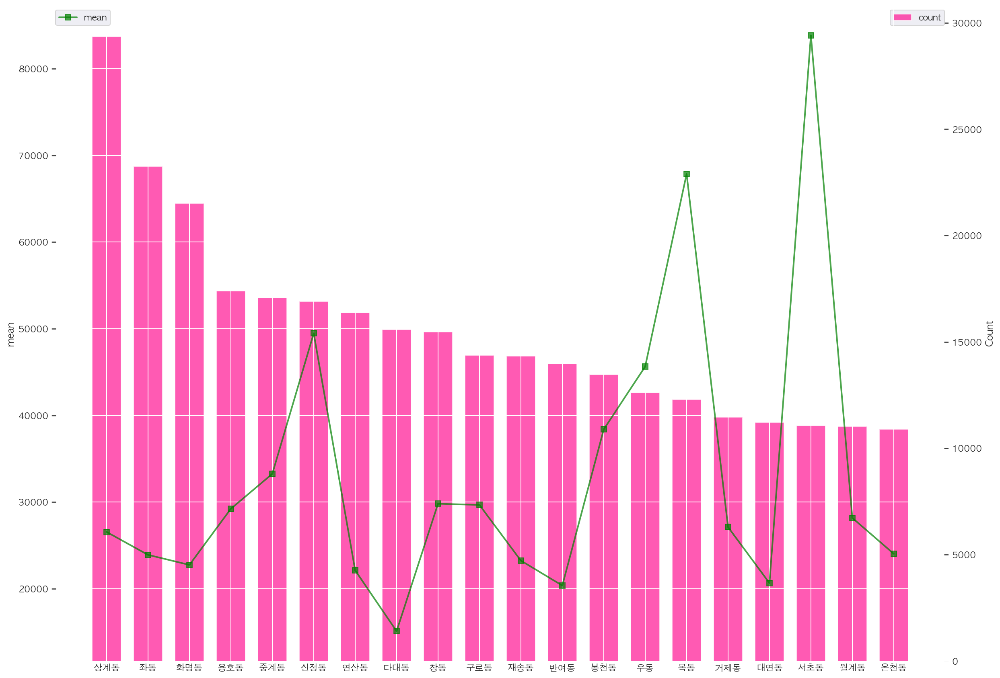

In [28]:
sns.set(font="AppleGothic", 
        rc={"axes.unicode_minus":False})

plt.rcParams['figure.figsize'] = (20, 15)
plt.rcParams['font.size'] = 12

x= dong
y = count["mean"]
y1 = count["count"]

fig, ax1 = plt.subplots()

ax1.plot(x, y,'-s', color='green',label='mean', markersize=7, linewidth=2, alpha=0.7)
ax1.tick_params(axis='both', direction='in')
ax1.set_ylabel('mean')

ax2 = ax1.twinx()

ax2.bar(x, y1,color='deeppink', label='count', alpha=0.7, width=0.7)
ax2.tick_params(axis='y', direction='in')
ax2.set_ylabel(r'Count')

ax1.set_zorder(ax2.get_zorder() + 10)
ax1.patch.set_visible(False)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

In [29]:
# 서울과, 부산 Data에서 거래량을 기준으로 count해 sort_value를 해본 상태이다.
# 좌측부터 순서대로 상계동, 좌동, 화명동, 용호동, 중계동 순으로 거래량이 Counting 된 모습을 볼 수 있다.
# 추가적으로 평균가격을 Plot로 추가해 표현해 보았다.
# 위 그래프를 보았을때 거래량과 평균 집 가격에는 상관관계가 없다는 것을 확인 할 수 있다.

## Heatmap을 이용해 상관관계 분석

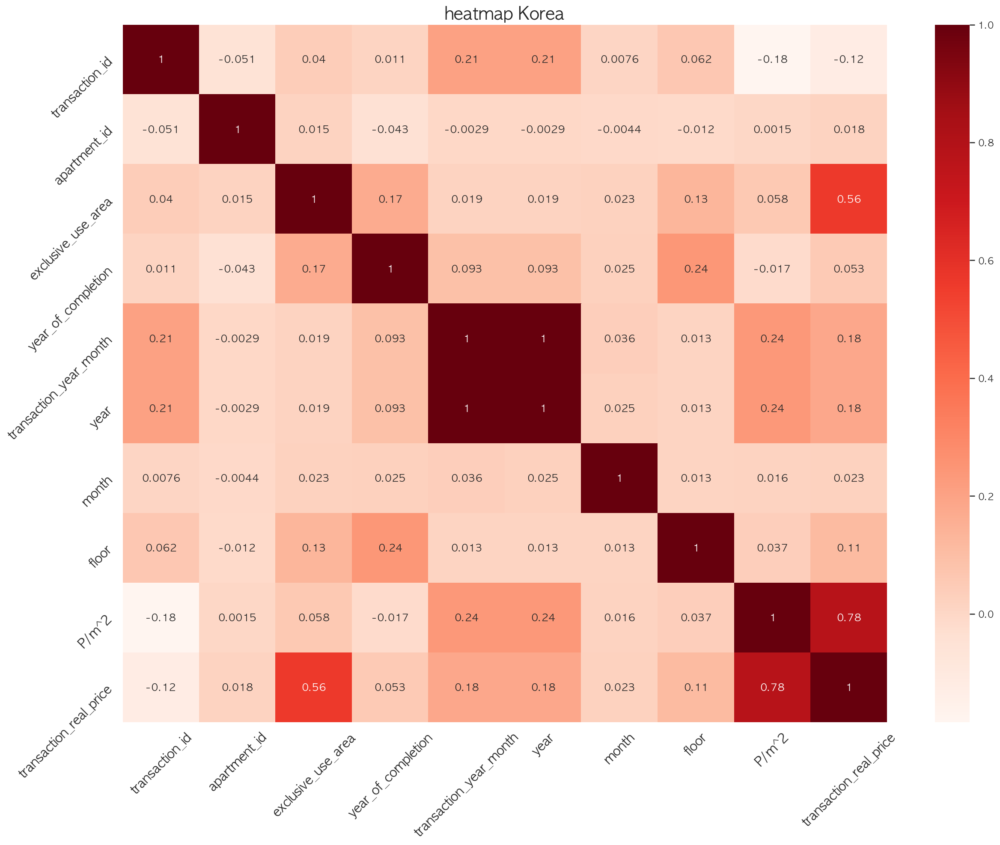

In [30]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

sns.heatmap(train.corr(), cmap="Reds", annot=True)
plt.title('heatmap Korea', fontsize=20)
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.show()

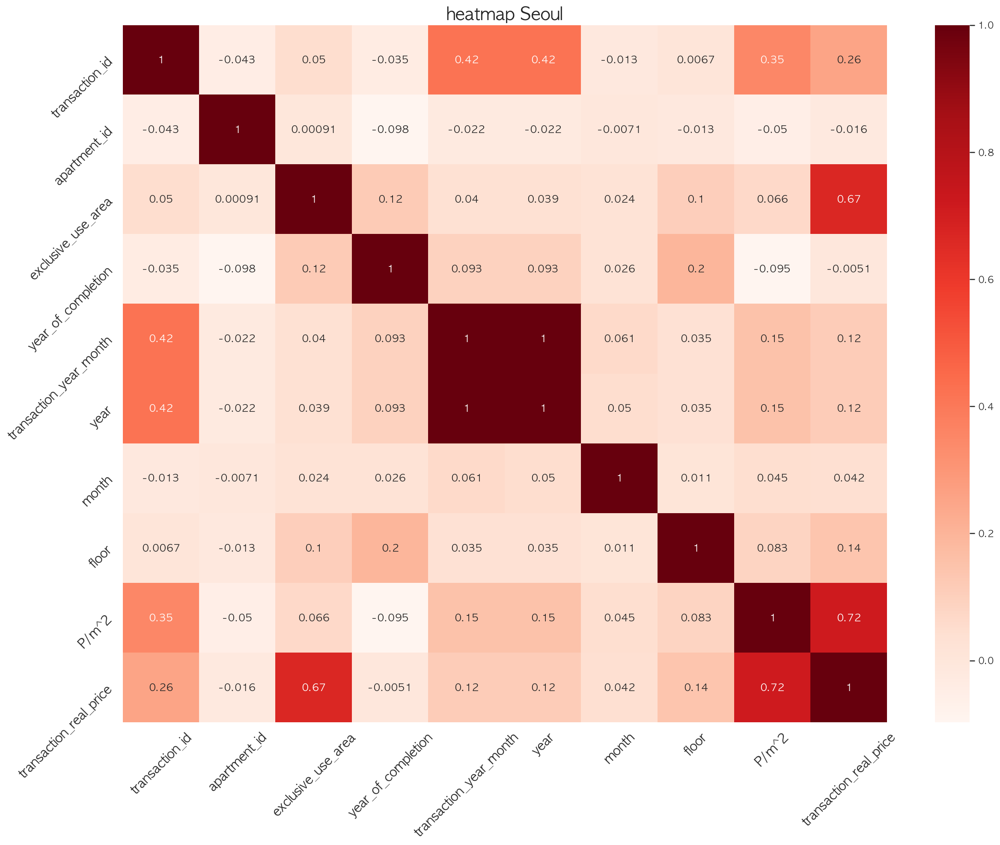

In [31]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

sns.heatmap(train[train['city'] == '서울특별시'].corr(), cmap="Reds", annot=True)
plt.title('heatmap Seoul', fontsize=20)
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.show()

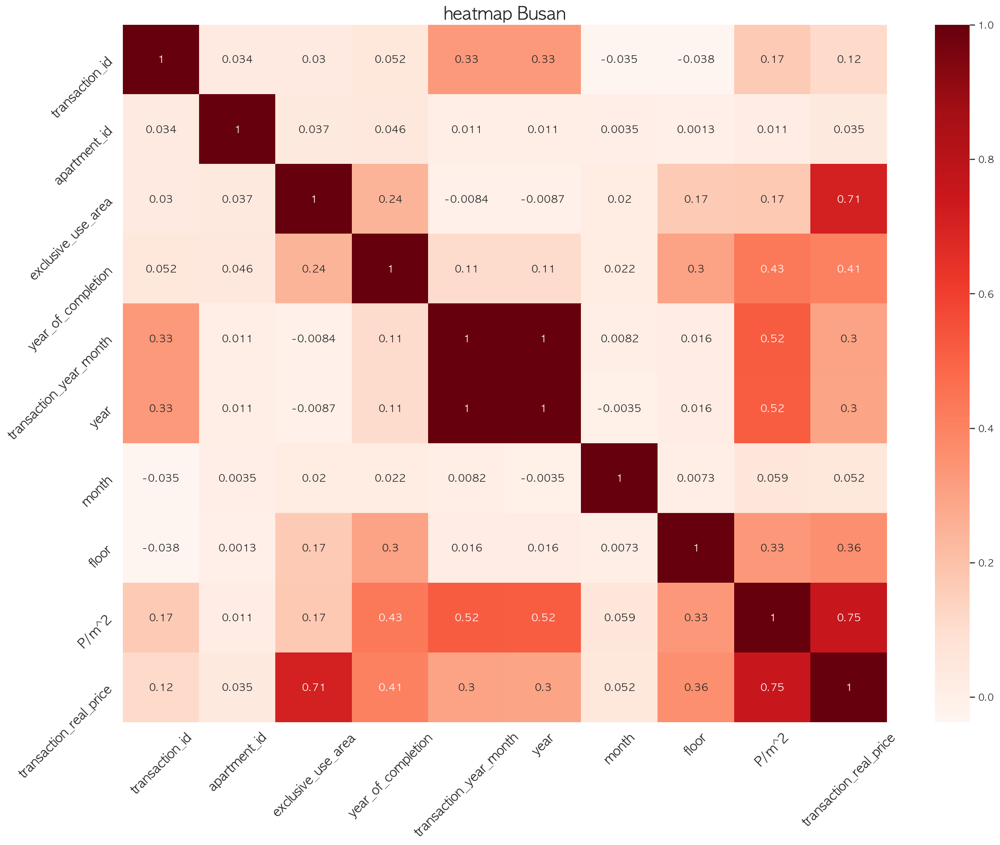

In [32]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

sns.heatmap(train[train['city'] == '부산광역시'].corr(), cmap="Reds", annot=True)
plt.title('heatmap Busan', fontsize=20)
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.show()

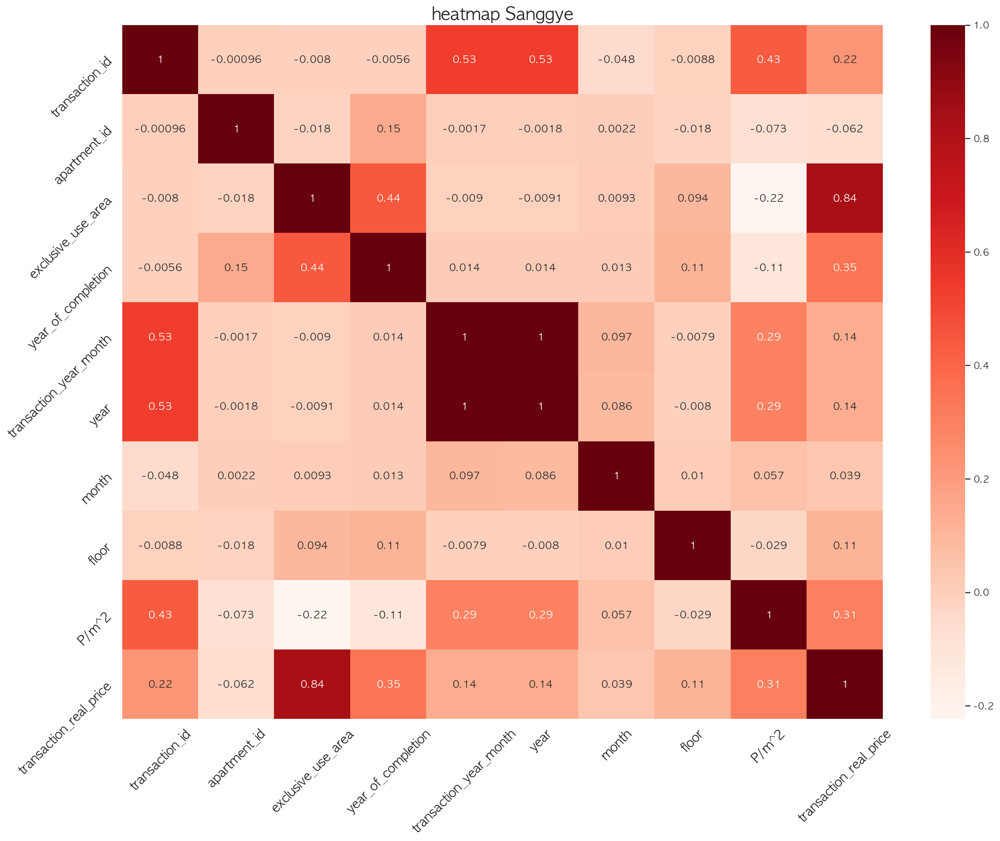

In [33]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

sns.heatmap(train[train['dong'] == '상계동'].corr(), cmap="Reds", annot=True)
plt.title('heatmap Sanggye', fontsize=20)
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.show()

In [34]:
# 넓은 지역 (국내, 서울,부산)의 상관계수는 넓이당 가격이 가장 높았지만, 범위를 좁힌 동으로 했을 때는 넓이당 가격이 평준화 되면서 평수가 중요함을 알게 되었다.
# 평당 가격을 잘 이용하기 위해서는 좁은 범위인, 동이나 아파트ID를 이용해야 함을 명확히 할 수 있었다.

## 대략적 서울 집 값 분포를 확인해보자

In [35]:
# 월별 거래량을 count로 정리해  max, min을 출력한다음, (max - min) / max 로 스케일링을 진행하였다,
# 어느 동의데이터가 거래량의 감소폭이 적고 꾸준한 거래량을 보이는 지역인지 확인을 하고 싶어서 데이터 변환을 진행하였다.
# 이 변환을 통해서 예상되는 결과는 
# 가설 : 대치동과 같이 꾸준히 거래가 되는 지역이 있을 것이다. 대치동은 교육열이 높은 곳으로 유사한 값이 나온 지역도 교육열이 높을 것이다.

In [36]:
df2 = train.groupby(["dong", "month"]).size().reset_index(name="Count")
df2 = df2.pivot("dong", "month", "Count")
df2.replace(np.NaN, 0, inplace=True)
list = []
for idx, idxn in zip(df2.index,range(len(df2.index))) :
    list.append( [idx, max(df2.loc[df2.index[idxn]]), min(df2.loc[df2.index[idxn]])])
list = pd.DataFrame(list)
list.columns = ['dong', 'max', 'min']
list['max-min'] = (list['max'] - list['min']) / list['max']
list_sort = list.sort_values(by=['max-min'], ascending=True).head(20)
list_sort

,dong,max,min,max-min
100,대치동,732.0,548.0,0.251366
404,천연동,68.0,50.0,0.264706
106,도곡동,620.0,441.0,0.288710
365,잠원동,816.0,576.0,0.294118
339,우동,1252.0,875.0,0.301118
382,정관읍 용수리,506.0,352.0,0.304348
23,광장동,441.0,304.0,0.310658
167,민락동,288.0,198.0,0.312500
233,서초동,1103.0,752.0,0.318223
338,용호동,1767.0,1203.0,0.319185


In [37]:
# 결과를 확인해보니 대치동에서 max - min의 차이가 적은 것으로 확인 되었으며, 천연동은 서대문구에 위치하고 있으며 거래량이 적어 넘어 가도록 하겠습니다.
# 도곡동, 잠원동, 우동은 예상이 되는 지역이며 정관읍 용수리는 부산의 신도시로 신규아파트 입주로 인해 많은 거래가 있는 것으로 확인이 되었습니다.
# 전체 데이터 중 20의 데이터를 정렬해 확인해보았으며, 초기에 정해놓은 가설과 유사한 모습을 보였으며,
# 전통적으로 교육열이 높은 곳과 더불어 신도시가 거래량이 꾸준한 모습을 보였습니다.
# 해당 자료를 이용해 부동산 영업을 진행한다면 꾸준한 수익이 가능 할 것으로 보입니다.

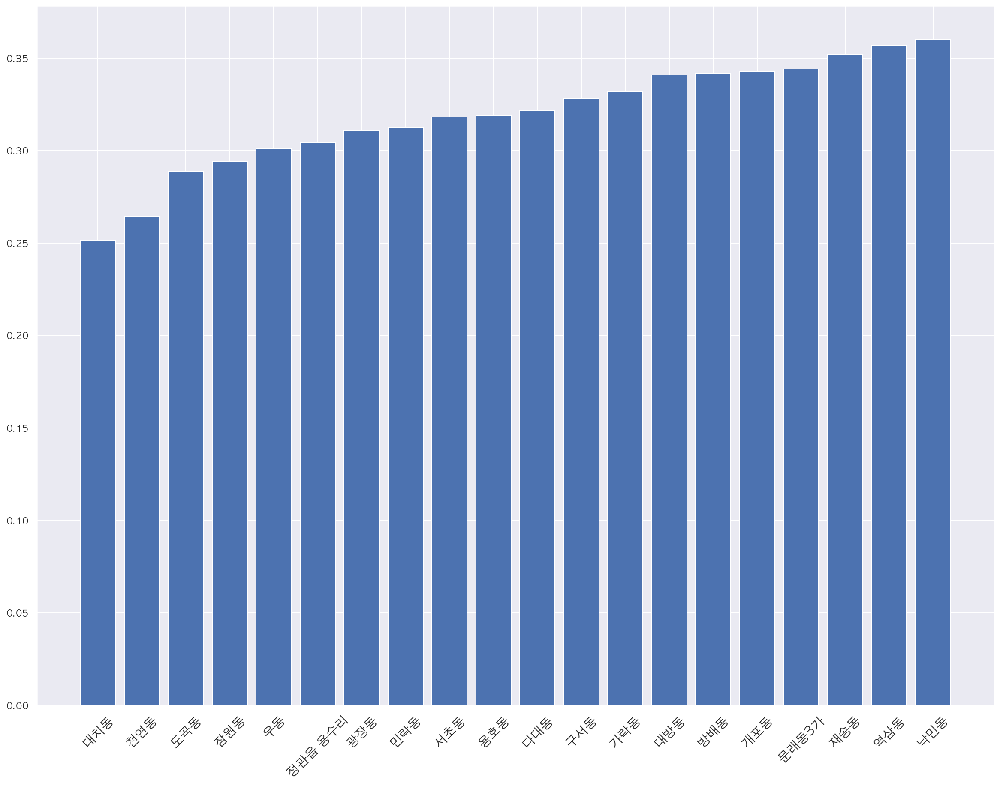

In [38]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

plt.bar(list_sort['dong'], list_sort['max-min'])
plt.xticks(rotation=45, fontsize=15)

plt.show()

In [39]:
s_pivot = pd.pivot_table(df1, index=["city","dong"],values=["transaction_real_price"], aggfunc = ['mean','median','min','max','sum','count'])

In [40]:
seoul_count = s_pivot.xs('서울특별시')['mean']
seoul_count.sort_values(by="transaction_real_price",ascending=False).head(50)

,transaction_real_price
dong,
장충동1가,269888.888889
압구정동,164534.722914
청암동,161403.700000
용산동5가,153497.331633
회현동2가,139906.140351
반포동,132489.395651
한남동,122593.293264
서빙고동,116547.239777
대치동,116320.538909


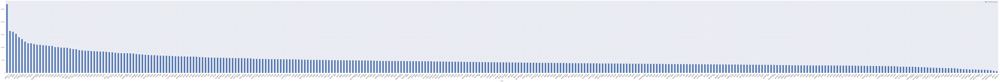

In [41]:
#fig.set_facecolor('white')
seoul_count.sort_values(by="transaction_real_price",ascending=False).plot(kind='bar', figsize=(200,15))
#fig.set_facecolor('white')
plt.xticks(rotation=45, fontsize=15)
plt.show()

In [42]:
# pivot을 활용하여 서울 지역 집가격의 평균을 구해 bar chart로 표현해 보았다.
# 상위 지역 중 낯선 지역이 보인다. 청암동이 발견되었는데 해당지역은 서대문에 위치해 있으며
# 해당 동 자체에 아파트가 많이 있지 않은것으로 보이고 상대적으로 표본은 적은 상태에서 비교적 높은 시세를 유지한 것으로 보인다.

In [43]:
busan_count = s_pivot.xs('부산광역시')['max']
busan_count.sort_values(by="transaction_real_price",ascending=False).head(50)

,transaction_real_price
dong,
우동,412787
재송동,220000
온천동,199330
남천동,179400
용호동,178350
범일동,177000
중동,166300
부전동,145000
민락동,132500


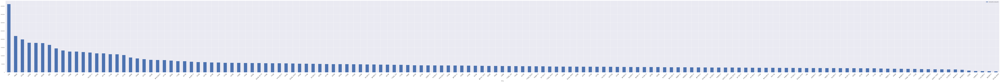

In [44]:
busan_count.sort_values(by="transaction_real_price",ascending=False).plot(kind='bar', figsize=(200,15))
plt.xticks(rotation=45, fontsize=15)
#fig.set_facecolor('white')
plt.show()

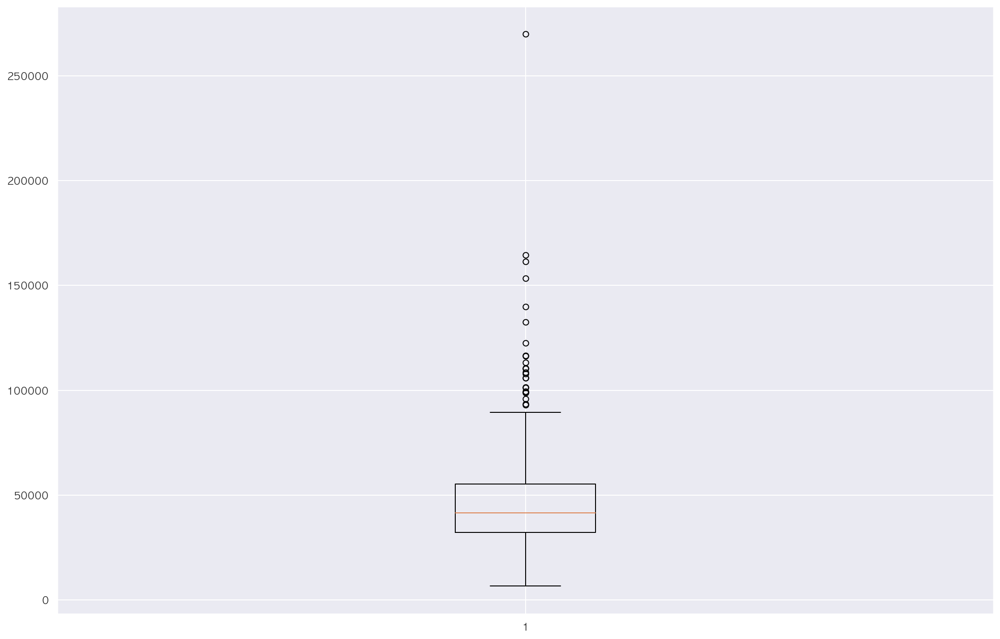

In [45]:
plt.figure(figsize=(18,12))
plt.boxplot(s_pivot.xs('서울특별시')["mean"])
plt.show()

 <img src="./datas/pieris.png" style="width:30%;">

## 동별 아파트 가격에 대한 대략적인 시각화

In [46]:
groupby_min = pd.DataFrame(df1.groupby("dong").transaction_real_price.min())
groupby_min.rename(columns={'transaction_real_price' : 'min'}, inplace=True)

In [47]:
groupby_max = pd.DataFrame(df1.groupby("dong").transaction_real_price.max())
groupby_max.rename(columns={'transaction_real_price' : 'max'}, inplace=True)

In [48]:
groupby_mean = pd.DataFrame(df1.groupby("dong").transaction_real_price.mean())
groupby_mean.rename(columns={'transaction_real_price' : 'mean'}, inplace=True)

In [49]:
groupby_std = pd.DataFrame(df1.groupby("dong").transaction_real_price.std())
groupby_std.rename(columns={'transaction_real_price' : 'std'}, inplace=True)

In [50]:
groupby_count = pd.DataFrame(df1.groupby("dong").transaction_real_price.count())

In [51]:
groupby_df1 = pd.concat([groupby_max, groupby_mean, groupby_min], axis=1)

In [52]:
groupby_df1['count'] = groupby_count

In [53]:
groupby_df1['Score_squareroot']=np.sqrt((groupby_df1['count']))

In [54]:
groupby_std = pd.DataFrame(df1.groupby("dong").transaction_real_price.std())
groupby_std.rename(columns={'transaction_real_price' : 'std'}, inplace=True)

In [55]:
groupby_df1['Score_squareroot']=np.sqrt((groupby_df1['count']))

In [56]:
groupby_df1 = pd.concat([groupby_max, groupby_mean, groupby_min, groupby_std], axis=1)

In [57]:
groupby_df1['sort'] = groupby_df1['max'] - groupby_df1['min']

In [58]:
groupby_count = pd.DataFrame(df1.groupby("dong").transaction_real_price.count())

In [59]:
groupby_df1['count'] = groupby_count
groupby_df1['Score_squareroot']=np.sqrt((groupby_df1['count']))

In [60]:
low = groupby_df1['mean'] - 1.96 * (groupby_df1['std']/(groupby_df1['Score_squareroot']))
high = groupby_df1['mean'] + 1.96 * (groupby_df1['std']/(groupby_df1['Score_squareroot']))

In [61]:
low_95 = pd.DataFrame(low)
high_95 = pd.DataFrame(high)

In [62]:
groupby_df1['low']=low_95
groupby_df1['high']=high_95

In [63]:
groupby_df1

,max,mean,min,std,sort,count,Score_squareroot,low,high
dong,,,,,,,,,
가락동,131500,54967.955681,1500,14630.303821,130000,9567,97.811042,54674.784329,55261.127033
가리봉동,32300,24241.186441,13000,3896.735630,19300,59,7.681146,23246.855375,25235.517506
가산동,58450,26812.244082,8889,9981.864532,49561,1225,35.000000,26253.259668,27371.228495
가야동,52500,20207.466579,2200,10164.129646,50300,3785,61.522354,19883.654291,20531.278867
가양동,115000,32263.930082,10000,14627.605091,105000,6622,81.375672,31911.612180,32616.247983
...,...,...,...,...,...,...,...,...,...
효창동,123000,51399.878378,14500,18028.839663,108500,444,21.071308,49722.881081,53076.875676
후암동,120000,49870.036496,8000,20119.032876,112000,274,16.552945,47487.783454,52252.289539
휘경동,64500,34295.183976,9091,10218.115117,55409,2696,51.923020,33909.468630,34680.899323


In [64]:
groupby_df1.sort_values(by = 'sort', inplace=True)

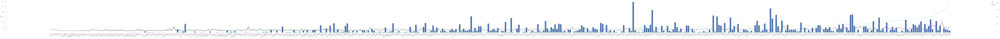

In [65]:
X = groupby_df1.index
y = groupby_df1

fig, ax1 = plt.subplots(figsize=(300,10))

fig.set_facecolor('white')

plt.xticks(rotation=45, fontsize=15)
ax1.set_xlabel('동')
ax1.set_ylabel('Count')
ax2 = ax1.twinx()
ax2.set_ylabel('Price')


ax2.plot(X, y['mean'],label='mean', color='r', marker='o',linewidth=3)
ax2.plot(X, y['max'], label='max', color='g', marker='*',linewidth=1)
ax2.plot(X, y['min'], label='min', color='g', marker='*',linewidth=1)
ax2.plot(X, y['low'], label='low_95%', color='b', marker='*',linewidth=1)
ax2.plot(X, y['high'], label='high_95%', color='b', marker='*',linewidth=1)
ax1.bar(X, y['count'])

plt.legend()

plt.show()

In [66]:
#신뢰구간 95%를 설정해 동별 가격을 보았을때 2곳에서 신뢰구간이 포함이 되지 않음을 발견했다.

In [67]:
groupby_df1.loc["주성동"].reset_index()

,index,주성동
0,max,117000.000000
1,mean,106000.000000
2,min,95000.000000
3,std,15556.349186
4,sort,22000.000000
5,count,2.000000
6,Score_squareroot,1.414214
7,low,84440.000000
8,high,127560.000000


In [68]:
(groupby_df1.loc["주성동"]['max'])-(groupby_df1.loc["주성동"]['min']) > (groupby_df1.loc["주성동"]['high'])-(groupby_df1.loc["주성동"]['low'])

False

In [69]:
groupby_df1.loc["교남동"].reset_index()

,index,교남동
0,max,124500.000000
1,mean,108600.000000
2,min,96500.000000
3,std,14381.585448
4,sort,28000.000000
5,count,3.000000
6,Score_squareroot,1.732051
7,low,92325.704030
8,high,124874.295970


In [70]:
(groupby_df1.loc["교남동"]['max'])-(groupby_df1.loc["교남동"]['min']) > (groupby_df1.loc["교남동"]['high'])-(groupby_df1.loc["교남동"]['low'])

False

In [71]:
meandata = train.groupby('dong').mean()
countdata = train.groupby('dong').count()
countdata = countdata['transaction_id'].rename('count')
countdata = pd.DataFrame(countdata)
meandata = pd.concat([meandata, countdata], axis=1)

In [72]:
meandata

,transaction_id,apartment_id,exclusive_use_area,year_of_completion,transaction_year_month,year,month,floor,P/m^2,transaction_real_price,count
dong,,,,,,,,,,,
가락동,647309.194627,4838.917320,67.629924,1991.382251,201302.942511,2012.965820,6.360510,7.630710,898.943953,54967.955681,9567
가리봉동,457230.084746,11849.254237,76.268475,1998.423729,201326.983051,2013.203390,6.644068,9.203390,319.878887,24241.186441,59
가산동,469902.710204,3908.305306,60.743495,2002.240000,201351.884898,2013.456327,6.252245,11.086531,562.429110,26812.244082,1225
가야동,743643.322589,5426.476618,81.036506,1995.665786,201254.728137,2012.482959,6.432232,8.428005,243.199671,20207.466579,3785
가양동,454446.522803,2194.682573,60.368251,1994.691332,201341.590607,2013.354123,6.178345,8.355029,543.557324,32263.930082,6622
...,...,...,...,...,...,...,...,...,...,...,...
효창동,146612.481982,10750.851351,87.116227,2001.051802,201365.923423,2013.601351,5.788288,6.819820,616.034638,51399.878378,444
후암동,123478.627737,9103.759124,89.719964,1993.978102,201288.565693,2012.821168,6.448905,3.251825,569.887120,49870.036496,274
휘경동,174219.989985,8473.300445,74.881195,2002.077151,201321.750000,2013.156528,6.097181,10.411350,464.836993,34295.183976,2696


In [73]:
meandata.drop(['transaction_id', 'apartment_id', 'transaction_year_month'], axis=1, inplace=True)

In [74]:
meandata

,exclusive_use_area,year_of_completion,year,month,floor,P/m^2,transaction_real_price,count
dong,,,,,,,,
가락동,67.629924,1991.382251,2012.965820,6.360510,7.630710,898.943953,54967.955681,9567
가리봉동,76.268475,1998.423729,2013.203390,6.644068,9.203390,319.878887,24241.186441,59
가산동,60.743495,2002.240000,2013.456327,6.252245,11.086531,562.429110,26812.244082,1225
가야동,81.036506,1995.665786,2012.482959,6.432232,8.428005,243.199671,20207.466579,3785
가양동,60.368251,1994.691332,2013.354123,6.178345,8.355029,543.557324,32263.930082,6622
...,...,...,...,...,...,...,...,...
효창동,87.116227,2001.051802,2013.601351,5.788288,6.819820,616.034638,51399.878378,444
후암동,89.719964,1993.978102,2012.821168,6.448905,3.251825,569.887120,49870.036496,274
휘경동,74.881195,2002.077151,2013.156528,6.097181,10.411350,464.836993,34295.183976,2696


## 각 컬럼을 평균순으로 나열해 보았다.

In [75]:
a = meandata[[data]].sort_values(data).tail(20)
a = (a-min(a.values)) / (max(a.values) - min(a.values))

NameError: name 'data' is not defined

In [76]:
a.reset_index()

NameError: name 'a' is not defined

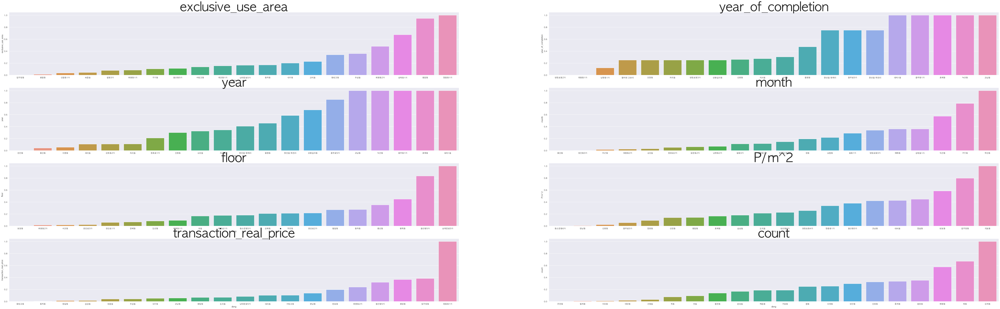

In [77]:
plt.figure(figsize=(100, 30))

for idx, data in zip(range(len(meandata.columns)) , meandata.columns):
    plt.subplot(4, 2, idx+1)
    a = meandata[[data]].sort_values(data).tail(20)
    a = (a-min(a.values)) / (max(a.values) - min(a.values))
    a = a.reset_index()
    sns.barplot(data = a, x='dong', y= data)
    plt.title(data, fontsize = 70)
    # plt.axis('off')
    
plt.show()

# 새로운 변수를 추가해보자

## 공원 Data

In [ ]:
park.tail() #train data와  park data는 시와 동을 엮어 분석을 진행할 예정이다.

In [ ]:
park.info() # 공원 Datad에 null 값이 많다. 대략적으로 보니 각 공원별로 장비의 유무를 나타내는 것 같다

In [ ]:
park_df = pd.DataFrame(park, columns=["city","gu","dong","park_name","park_type","park_area","park_exercise_facility",
                                      "park_entertainment_facility","park_benefit_facility","park_cultural_facitiy","park_facility_other","park_open_year","reference_date"])
park_df.tail()

In [ ]:
park_rank = (park_df.groupby('dong')['park_area'].agg(['sum'])).sort_values(by='sum', ascending=False)
park_rank.head(10)

In [ ]:
# 새로운 x 값이 생겼다. 집값과의 상관관계를 밝혀보자

In [ ]:
pd.pivot_table(park_df, index='dong',aggfunc="sum")[['park_area']].reset_index()

In [ ]:
park_count = park_df.groupby(['dong'])["park_area"].count().reset_index()

In [ ]:
corr_park_count = pd.merge(park_count, df1)

In [ ]:
park_sum = pd.merge(pd.pivot_table(park_df, index='dong')[['park_area']].reset_index(), df1)

In [ ]:
# 동별 공원의 넓이 합과 집값의 상관관계를 보자

In [ ]:
np.corrcoef(park_sum['park_area'], park_sum['transaction_real_price'])[0,1]

In [ ]:
# 동별 공원의 수와 집값의 상관관계를 보자

In [ ]:
np.corrcoef(corr_park_count['park_area'], corr_park_count['transaction_real_price'])[0,1]

# Regression

## linear regression
 - x1 : exclusive_use_area, x2 : year_of_completion, x3 : floor,
    - score =  0.3194554604195421
    - Mean_Squared_Error =  656071224.025548
    - RMSE =  25613.88732749381

 - x1 : exclusive_use_area, x2 : year_of_completion, x3 : floor, x4 : dong
    - score =  0.753000279857136
    - Mean_Squared_Error =  238117271.24869266
    - RMSE =  15431.04893546426

 - x1 : exclusive_use_area, x2 : apartment_id, x3 : floor, x4 : dong
    - score =  0.884690081565853
    - Mean_Squared_Error =  111163215.5273989
    - RMSE =  10543.396773687258

- x1 : exclusive_use_area, x2 : apartment_id, x3 : floor, x4 : dong, x5 : transaction_year_month
    - score =  0.9003701677303142
    - Mean_Squared_Error =  108359138.68998289
    - RMSE =  10409.569572752895
    
 <img src="./datas/dacon.png" style="width:150%;">

## Random Forest
 - columns
     - category : dong, apartment_id2, 
     - float : exclusive_use_area,year_of_completion,year, month, floor
 - params
     - n_estimators=100 
     - random_state=13 
     - max_depth=80 
     - max_leaf_nodes=5000

 - Mean squared error:  29631349.445886824
 - R2 score:  0.9692014870838667
 - RMSE score: 5443.468512436425

 
 
 <img src="./datas/RF.png" style="width:150%;">

## LGBM
 - columns
     - category : dong, apartment_id2, 
     - float : exclusive_use_area,year_of_completion,year, month, floor
 - params


In [80]:
best = pd.DataFrame([[100,5000,3688.88872155287],[40, 500, 3767.2188255416995], [40, 470, 3773.734609249986],[40, 440, 3779.8886402420894],[25, 100, 3975.145895653563], [25, 120, 3946.5334015130366],[10, 100, 4103.34157617724], [10, 120, 4064.319256966652], [10, 140, 4041.888347803674], [10, 160, 4023.3257594292195], [10, 180, 4008.309806856634],[15, 100, 3981.9591316680703], [15, 120, 3951.086582162809], [15, 140, 3927.07648125976],[25, 300, 3838.1515559441086], [25, 280, 3850.427535864345],[15, 300, 3836.975855985116],
 [15, 270, 3842.699696838895], [15, 240, 3856.147983271992], [15, 210, 3870.1379072696036],[70, 3000, 3663.809835262183], [60, 1000, 3740.97968704464], [60, 800, 3738.4109722560047], [60, 600, 3756.1232253862063],[70, 2500, 3670.7078738845394],[35, 100, 3961.4431866306863], [80, 5000, 3660.2213374375324], [80, 4500, 3665.869183414939], [80, 10000, 3699.4864508],[90, 5000, 3688.088936020], [80, 5000, 3692.060901569054]]).rename(columns={0:'max_depth', 1:'num_leaves', 2: 'RMSE'})

In [7]:
best.sort_values('RMSE')

,max_depth,num_leaves,RMSE
26,80,5000,3660.221337
20,70,3000,3663.809835
27,80,4500,3665.869183
24,70,2500,3670.707874
29,90,5000,3688.088936
0,100,5000,3688.888722
30,80,5000,3692.060902
28,80,10000,3699.486451
22,60,800,3738.410972
21,60,1000,3740.979687


# y :" transaction_real_price"
- Mean squared error:  13631313.700894894
- R2 score:  0.9858895733066445
- RMSE score: 3692.060901569054

# y : P/m^2
- Mean squared error:  1170.9034954098092
- R2 score:  0.9867032659809915
- RMSE score: 3421.846716920279


 
 <img src="./datas/dacon bests.png" style="width:150%;">